In [1]:
%matplotlib inline

In [2]:
import geopandas as gp
import pandas as pd
import ast
import json
from shapely.geometry import Polygon
import matplotlib.pyplot as plt
import numpy as np
import mplleaflet

plt.rcParams['figure.figsize'] = 12, 8

In [555]:
df = gp.read_file('../landfill_geojson.geojson')

In [556]:
df.shape

(1024, 14)

In [593]:
g = df.groupby('task_id').size()

In [594]:
g

task_id
501701    13
501702    16
501703    11
501704     3
501706     9
501708     6
501709    10
501710     8
501711     3
501712     5
501713    11
501714     5
501715     8
501716     9
501718    10
501719     1
501720    10
501721     6
501722     3
501723     1
501724    14
501725     5
501726     4
501727     4
501728     5
501729     4
501731     3
501732     3
501733     2
501734     4
          ..
502848     1
502853     1
502854     3
502856     1
502857     1
502859     2
502860     5
502863     2
502864     1
502865     1
502867     1
502870     1
502873     2
502882     1
502884    10
502885     2
502886     4
502887     2
502888     1
502891     2
502895     1
502904     1
502905     1
502908     1
502909     1
502910     1
502913     2
502914     1
502926     1
502930     2
dtype: int64

In [70]:
df.crs

{'init': u'epsg:4326'}

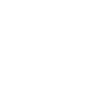

In [77]:
df['geometry'][702]

In [557]:
mask = df['geometry'].map(lambda x: x.is_valid)

In [558]:
landfills = df[mask]

In [577]:
landfills.shape

(997, 14)

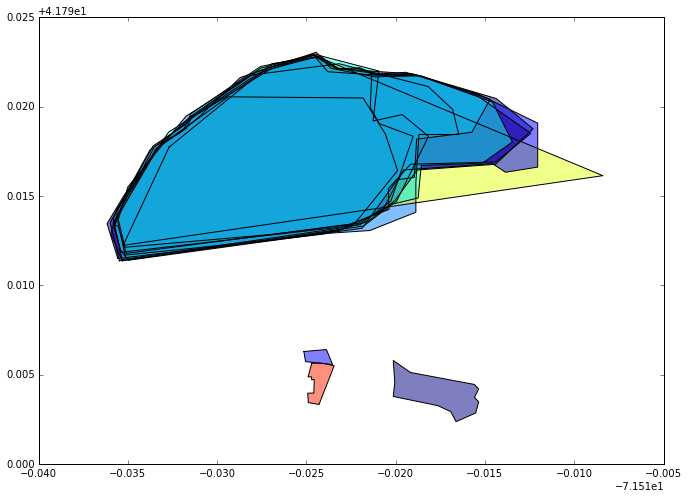

In [7]:
df[df['task_id'] == 501701].plot()

In [124]:
in_valid_geom = df[~mask].index

In [128]:
in_valid_geom = list(in_valid_geom)

In [131]:
df.drop(in_valid_geom, inplace=True)

In [134]:
# divide by two because the function returns lat/lon.
ppp = df['geometry'].map(lambda x: len(x.array_interface_base['data']) / 2)

In [139]:
pd.Series(ppp).describe()

count    997.000000
mean      12.823470
std        7.603696
min        4.000000
25%        7.000000
50%       11.000000
75%       16.000000
max       55.000000
Name: geometry, dtype: float64

In [144]:
pd.Series(ppp).median()

11.0

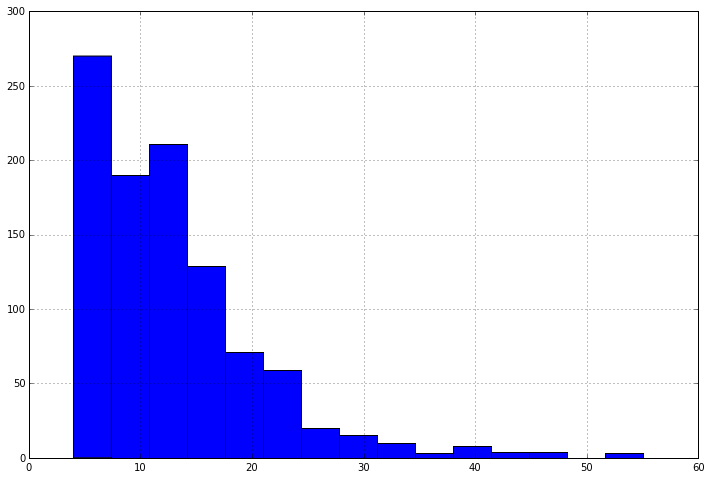

In [143]:
pd.Series(ppp).hist(bins=15)

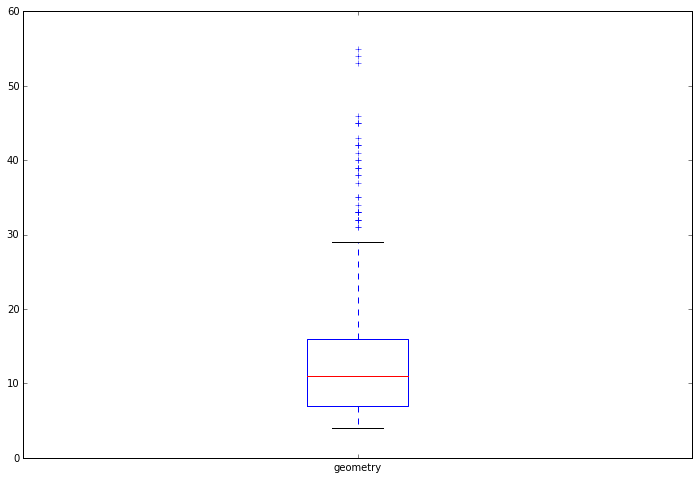

In [138]:
pd.Series(ppp).plot(kind='box')

---

In [578]:
j = landfills['geometry'].map(lambda x: landfills.intersects(x))

In [579]:
k = [i[i].index for i in j]

In [580]:
mask = []
for i in set(map(tuple, k)):
    mask.append([q for q in i])

In [596]:
mask

[[506],
 [544],
 [829],
 [205, 271],
 [301, 314],
 [766],
 [550, 579],
 [779],
 [413, 997],
 [985],
 [666],
 [603],
 [246],
 [872],
 [553],
 [85, 223],
 [281],
 [465],
 [519],
 [89, 227],
 [48, 61, 99, 103, 130, 139, 159],
 [788],
 [456],
 [83, 220],
 [831, 832],
 [675],
 [318],
 [612],
 [881],
 [268],
 [11, 29, 249],
 [562],
 [910],
 [566],
 [847],
 [474],
 [92],
 [797],
 [734],
 [869, 879],
 [390],
 [327],
 [248],
 [890],
 [277],
 [315, 929],
 [571],
 [840],
 [483],
 [164],
 [84, 221],
 [41, 47, 67, 110, 146, 169, 232, 240, 243, 255],
 [71, 117, 153, 187],
 [743],
 [370],
 [1012],
 [693],
 [320],
 [630],
 [962],
 [643],
 [286],
 [580],
 [530],
 [173],
 [815],
 [442],
 [736],
 [379],
 [974, 978],
 [338, 933],
 [746, 783, 792, 794, 795, 818],
 [745, 782, 792, 793, 818],
 [295, 326, 905, 921],
 [971],
 [284, 375, 431],
 [652],
 [589],
 [216],
 [501],
 [539],
 [82, 217],
 [808],
 [451],
 [380, 975],
 [347, 941],
 [392, 989],
 [774],
 [401],
 [711],
 [632],
 [19],
 [384, 982],
 [661],
 [2

In [615]:
landfills[(landfills['task_id'] == 501744) & (landfills['task_id'] == 501786)]

,area,fac_name,fac_state,fac_street,geometry,id,task_id,task_run__created,task_run__finish_time,task_run__id,task_run__user_ip,task_runinfo__certain,task_runinfo__skip,task_user_id


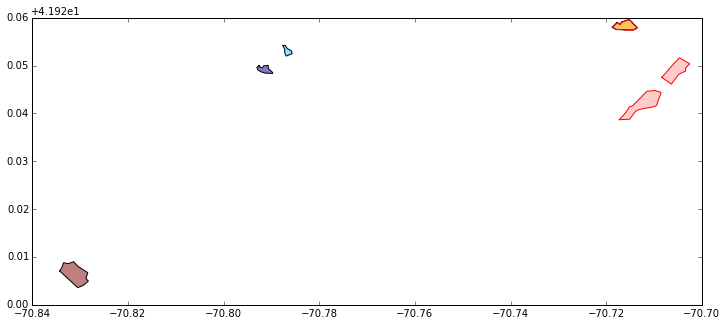

In [614]:
l = landfills[landfills['task_id'] == 501744].plot()

for i in landfills[landfills['task_id'] == 501786]['geometry']:
    gp.plotting.plot_multipolygon(l, i, edgecolor='red', alpha=0.2)

In [598]:
for landfill_groups in mask:
    print landfills.loc[landfill_groups]['task_id'].unique()

[502191]
[502243]
[502825]
[501744 501786]
[501812 501820]
[502694]
[502252 502303]
[502728]
[501986]
[501958]
[502500]
[502358]
[501765]
[502884]
[502254]
[501760]
[501805]
[502113]
[502213]
[501764]
[501706]
[502739]
[502070]
[501758]
[502834]
[502553]
[501825]
[502368]
[502887]
[501784]
[501704 501768]
[502269]
[501816]
[502284]
[502857]
[502127]
[501771]
[502761]
[502646]
[502884 502886]
[501964]
[501836]
[501766]
[502910]
[501801]
[501821]
[502289]
[502843]
[502135]
[501714]
[501759]
[501720]
[501728]
[502658]
[501936]
[502033]
[502577]
[501826]
[502389]
[501920]
[502400]
[501805]
[502304]
[502223]
[501722]
[502800]
[502045]
[502647]
[501950]
[501951]
[501869]
[502667 502732 502758 502809]
[502667 502732 502758 502809]
[501809 501835 501816]
[501945]
[501805 501948 502027]
[502423]
[502328]
[501752]
[502179]
[502235]
[501754]
[502782]
[502061]
[501951]
[501879]
[501967]
[502723]
[501976]
[502613]
[502390]
[501704]
[501954]
[502444]
[501806]
[502339]
[502201]
[502250]
[502808]
[502

In [449]:
landfills.loc[mask[3]]['area'].describe()

count        2.000000
mean     65198.076234
std       1347.125213
min      64245.514861
25%      64721.795548
50%      65198.076234
75%      65674.356921
max      66150.637608
Name: area, dtype: float64

In [545]:
stats = {}
for i, landfill_groups in enumerate(mask):
    task = landfills.loc[landfill_groups]['task_id'].unique()[0]
    l = len(landfills.loc[landfill_groups])
    stats[i] = {'task': task, 'max': None, 'min': None, 'mean': None, 'std': None, 'len': l, 'sum': None}
    
    stats[i]['max'] = landfills.loc[landfill_groups]['area'].max()
    stats[i]['min'] = landfills.loc[landfill_groups]['area'].min()    
    stats[i]['mean'] = landfills.loc[landfill_groups]['area'].mean()
    stats[i]['std'] = landfills.loc[landfill_groups]['area'].std()   
    stats[i]['sum'] = landfills.loc[landfill_groups]['area'].sum()       

In [499]:
stats = pd.DataFrame(stats).T
stats.fillna(0, inplace=True)

count        193.000000
mean      338602.900377
std       685309.076618
min          126.953618
25%         7874.533250
50%        37371.901334
75%       286430.492220
max      4655486.756445
Name: std, dtype: float64


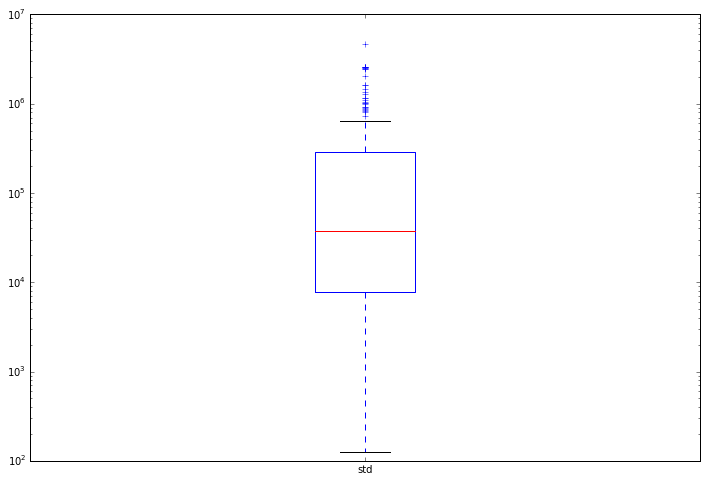

In [533]:
print stats[stats['std'] != 0]['std'].describe()
stats[stats['std'] != 0]['std'].order(ascending=True).reset_index()['std'].plot(kind='box', logy=True)

In [534]:
s = stats[stats['std'] != 0]

count        193.000000
mean      136884.791138
std       325515.978589
min           63.476809
25%         3260.907479
50%        14164.669026
75%       100099.567856
max      2327743.378223
dtype: float64


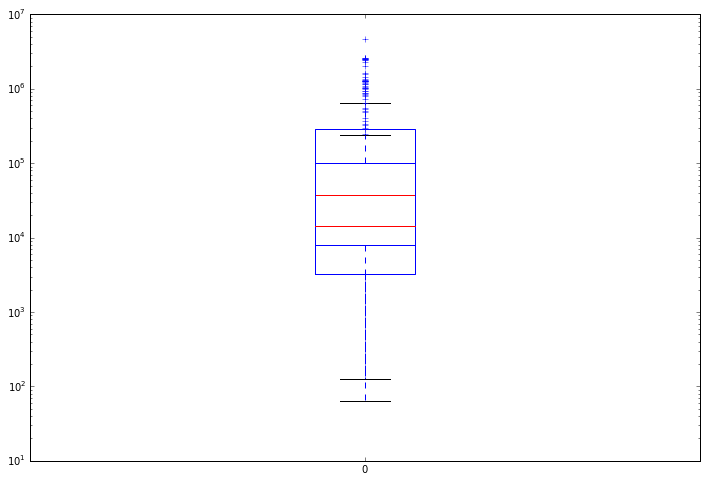

In [543]:
fig, axes = plt.subplots(1)
print (s['std'] / s['len']).describe()
stats[stats['std'] != 0]['std'].order(ascending=True).reset_index()['std'].plot(kind='box', logy=True, ax=axes)
(s['std'] / s['len']).order(ascending=True).reset_index()[0].plot(kind='box', logy=True, ax=axes)
#(stats['std'] / stats['len']).plot(kind='hist', bins=20, ax=axes[1])

In [550]:
s.head()

,len,max,mean,min,std,task
3,2,66150.637608,65198.076234,64245.514861,1347.125213,501744
4,2,3701305.316815,1926710.750501,152116.184187,2509655.703395,501812
6,2,3689295.382944,3232357.823353,2775420.263761,646207.293932,502252
8,2,889309.898113,769107.390721,648904.883330,169992.016185,501986
15,2,465661.271381,443551.052992,421440.834603,31268.570713,501760


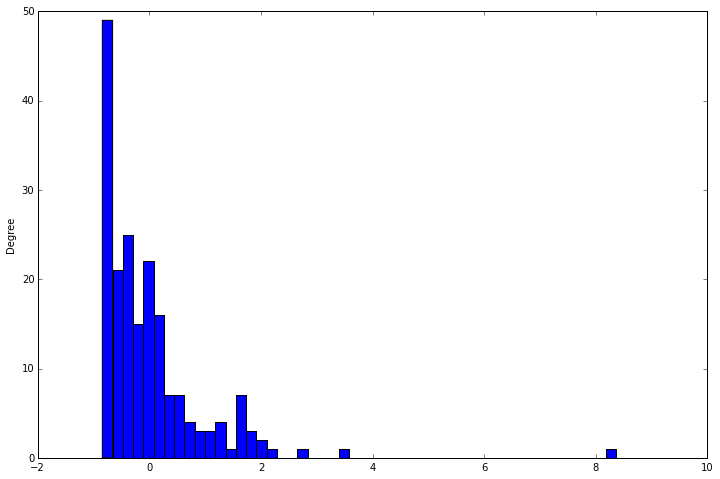

In [554]:
((s['mean'] - s['mean'].mean()) / s['mean'].std()).plot(kind='hist', bins=50)

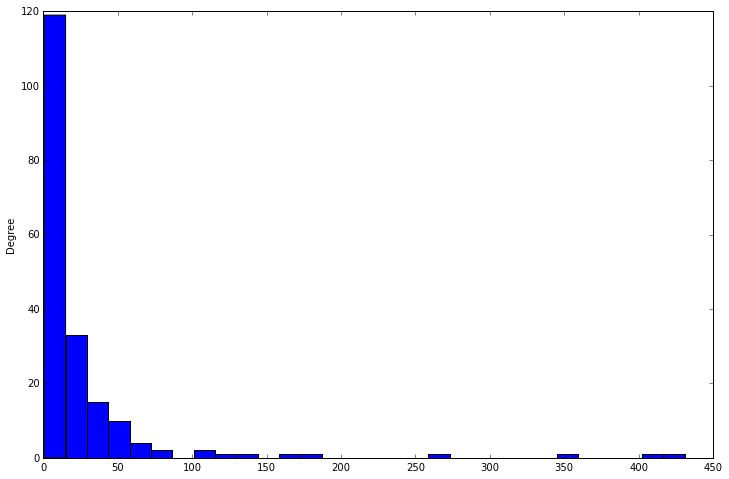

In [548]:
(s['mean'] / s['std']).plot(kind='hist', bins=30)

/usr/local/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


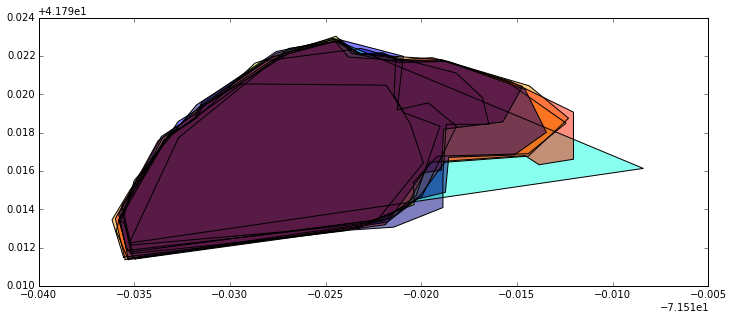

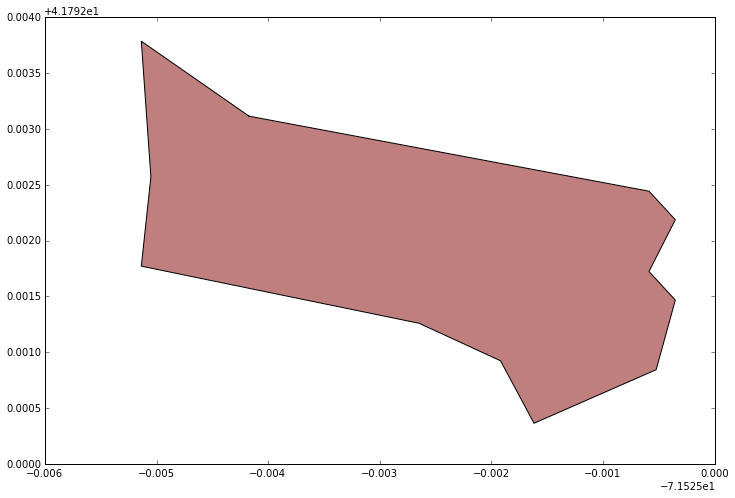

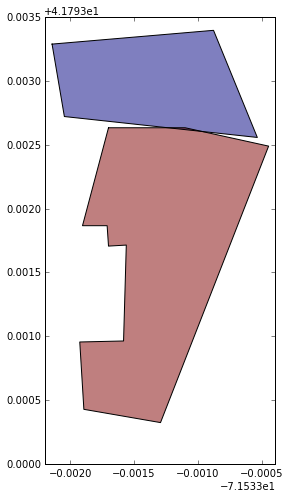

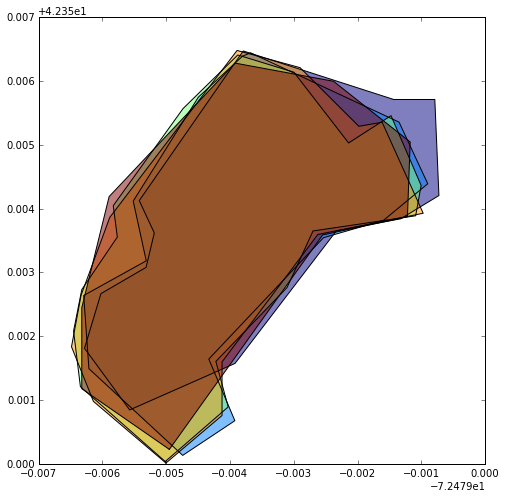

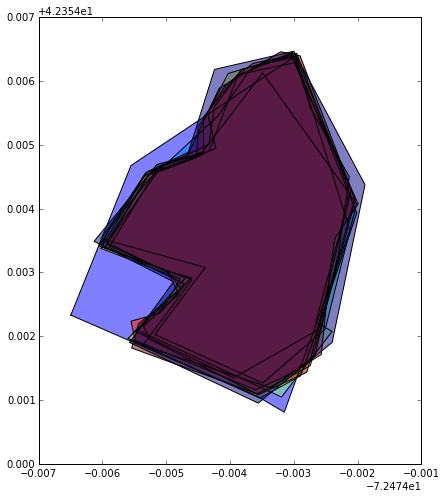

...

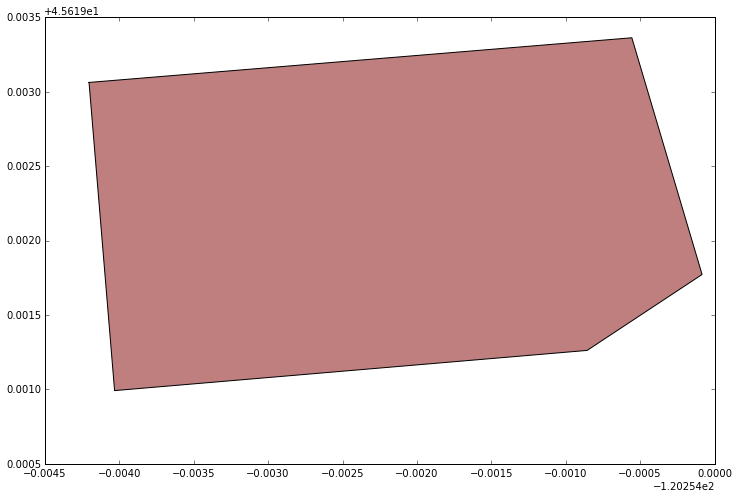

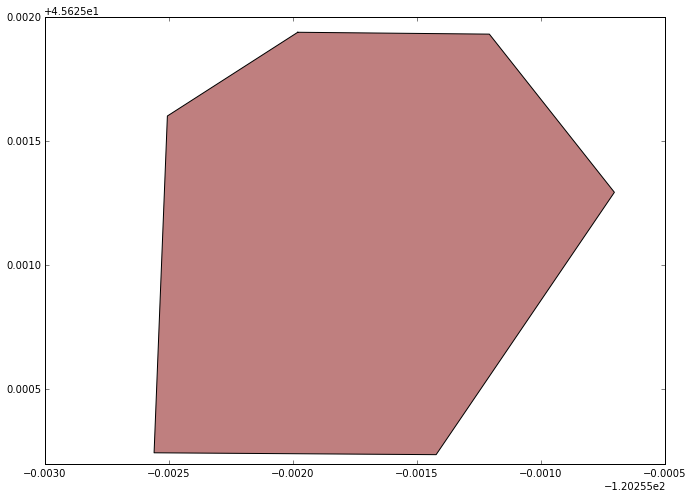

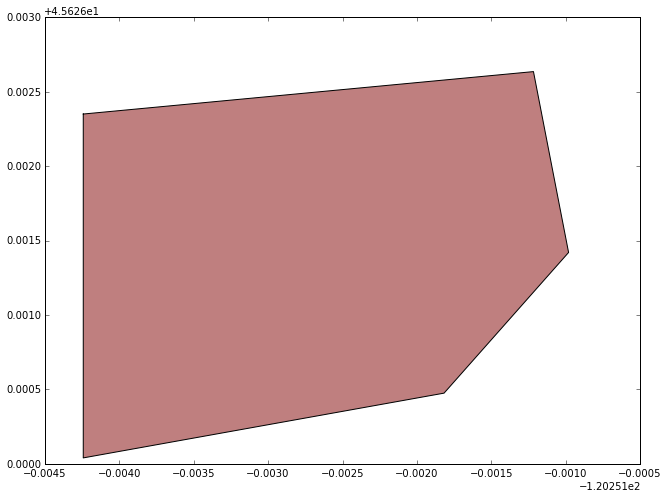

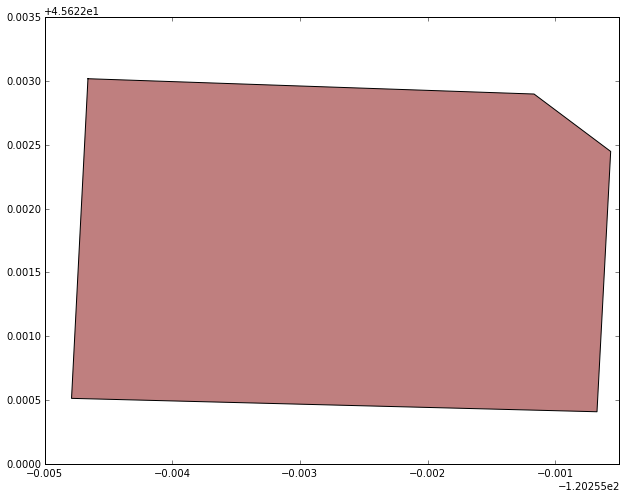

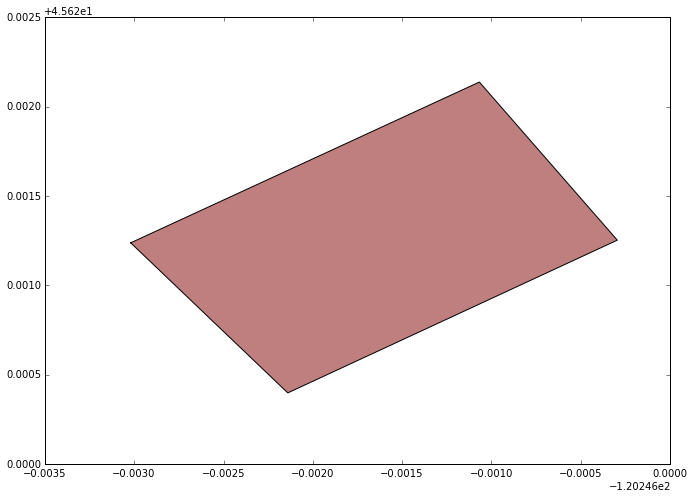

In [372]:
for i in mask:
    landfills.loc[i]['area']